# Tutorial on visualization of Neural Networks

This exercise aims at exploring different ways of visualizing Neural Networks:
- t-SNE of representations (CIFAR10)
- grad-CAM (ImageNet)
- activation maximization (ImageNet)

First, some preliminaries that facilitate plotting and data access on Google drive ... just execute !

In [1]:
import numpy as np
from matplotlib import pyplot as plt
from matplotlib.colors import ListedColormap

plt.rcParams['figure.figsize'] = (20.0, 20.0)
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

%matplotlib inline
%load_ext autoreload
%autoreload 2

import importlib.util
import sys


In [2]:
!pip install pytorch_lightning --quiet
!pip install transformers==4.46.1 --quiet

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 815.2/815.2 kB 32.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 891.4/891.4 kB 20.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.1/44.1 kB 1.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.0/10.0 MB 60.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.0/3.0 MB 54.3 MB/s eta 0:00:00


In [3]:
import torch

device = "cuda" if torch.cuda.is_available() else "cpu"

# Visualization of the encodings by t-SNE

First, we will visualize encodings of a network trained on the CIFAR data set. Here, we import and preprocess the data. We keep the original labels in `y_data` (to be used for visualization later on). For training, we need to transform them to one-hot-vectors.

In [4]:
from torchvision import datasets, transforms
from torch.utils.data import DataLoader, random_split

# Load CIFAR-10 dataset
transform = transforms.Compose([
    transforms.ToTensor(),
    #transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))  # normalize to [-1, 1]
])

train_data = datasets.CIFAR10(root='./data', train=True, download=True, transform=transform)
test_data = datasets.CIFAR10(root='./data', train=False, download=True, transform=transform)

# Separate training data into train and validation sets
train_size = 40000
val_size = len(train_data) - train_size
train_data, val_data = random_split(train_data, [train_size, val_size])

# Convert labels to one-hot encoding
def one_hot_encode(labels, num_classes=10):
    return torch.eye(num_classes)[labels]

# Load data into DataLoaders
train_loader = DataLoader(train_data, batch_size=64, shuffle=True)
val_loader = DataLoader(val_data, batch_size=64, shuffle=False)
test_loader = DataLoader(test_data, batch_size=64, shuffle=False)

100%|██████████| 170M/170M [00:13<00:00, 12.6MB/s]


Extracting ./data/cifar-10-python.tar.gz to ./data
Files already downloaded and verified


We will first visualize the data.

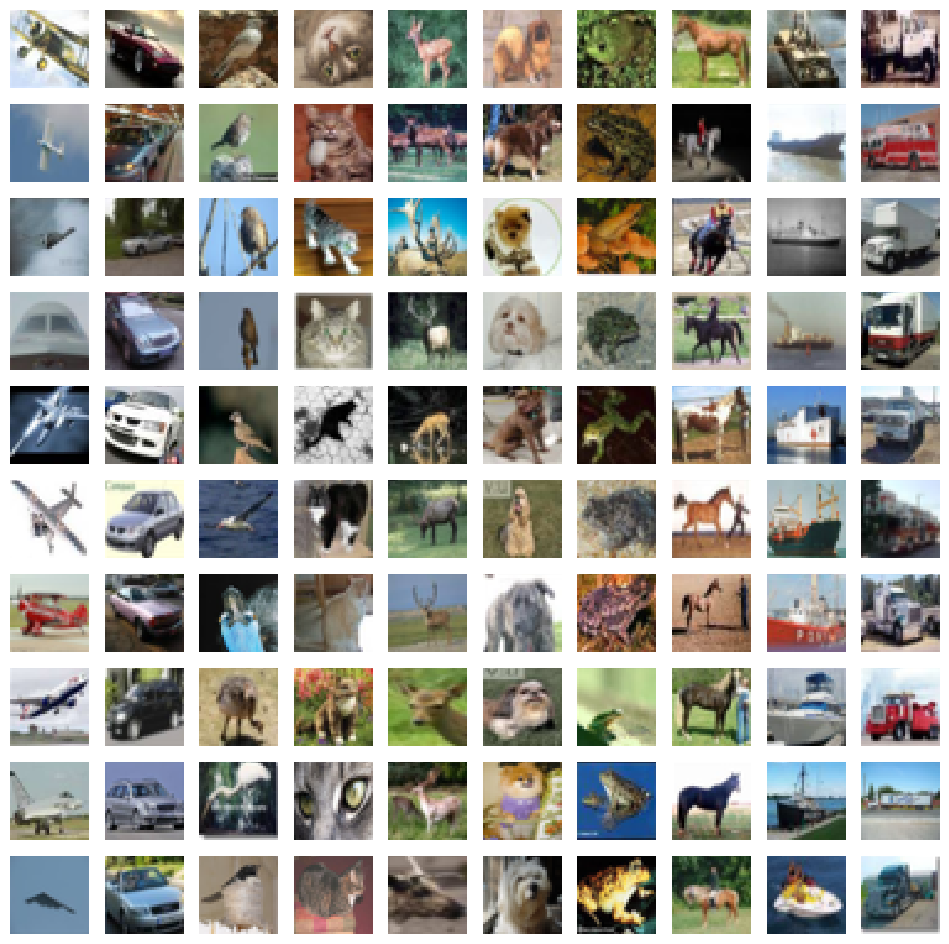

In [5]:
# helper function to plot a few images for each class
def plot_array(fig, dataset, classes_to_plot=None, samples_per_class=7):
    Y = dataset.targets
    if classes_to_plot is None:
        classes_to_plot = np.unique(Y)
    num_classes = len(classes_to_plot)

    for k, y in enumerate(classes_to_plot):
        idxs = np.flatnonzero(Y == y)
        idxs = np.random.choice(idxs, samples_per_class, replace=False)
        #print(y, idxs)

        for i, idx in enumerate(idxs):
            plt_idx = i * num_classes + k + 1
            ax = fig.add_subplot(samples_per_class, num_classes, plt_idx)
            image = dataset[idx][0].permute((1, 2, 0)) * 255
            ax.imshow(image.to(torch.uint8))
            ax.axis('off')
fig = plt.figure(figsize=(12, 12))
plot_array(fig, train_data.dataset, samples_per_class=10)

Next we define a neural network and train it on the data set. Here we use pytorch lightning to train the model using torch: https://lightning.ai/docs/pytorch/stable/starter/introduction.html

In [6]:
import torch
import torch.nn as nn
import torch.optim as optim
import pytorch_lightning as pl
from torchmetrics import Accuracy


class CNNModel(nn.Sequential):
    def __init__(self, num_class=10):
        super(CNNModel, self).__init__()
        # Feature extractor
        self.features = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.Conv2d(32, 32, kernel_size=3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2),
            nn.Dropout(0.2),

            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2),
            nn.Dropout(0.2),

            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.Conv2d(128, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2),
            nn.Dropout(0.2),

            nn.AdaptiveAvgPool2d((1, 1)),  # Global average pooling
            nn.Flatten()
        )

        # Classifier
        self.classifier = nn.Sequential(
            nn.Linear(128, 128),
            nn.ReLU(),
            nn.Dropout(0.2),
            nn.Linear(128, num_class)  # Output layer for 10 classes
        )

    def forward(self, x):
      embeddings = self.features(x)
      logits = self.classifier(embeddings)
      return logits

    def forward_features(self, x):
      return self.features(x)


# Define the Lightning Module
class LightningClassifier(pl.LightningModule):
    def __init__(self, model, learning_rate=0.001):
        super(LightningClassifier, self).__init__()
        self.model = model
        self.loss_fn = nn.CrossEntropyLoss()
        self.accuracy = Accuracy(task="multiclass", num_classes=10)
        self.learning_rate = learning_rate

    def forward(self, x):
        return self.model(x)

    def training_step(self, batch, batch_idx):
        x, y = batch
        y_hat = self(x)
        loss = self.loss_fn(y_hat, y)
        acc = self.accuracy(y_hat.softmax(dim=-1), y)
        self.log('train_loss', loss, prog_bar=True)
        self.log('train_acc', acc, prog_bar=True)
        return loss

    def validation_step(self, batch, batch_idx):
        x, y = batch
        y_hat = self(x)
        loss = self.loss_fn(y_hat, y)
        acc = self.accuracy(y_hat.softmax(dim=-1), y)
        self.log('val_loss', loss, prog_bar=True)
        self.log('val_acc', acc, prog_bar=True)

    def test_step(self, batch, batch_idx):
        x, y = batch
        y_hat = self(x)
        loss = self.loss_fn(y_hat, y)
        acc = self.accuracy(y_hat.softmax(dim=-1), y)
        self.log('test_loss', loss)
        self.log('test_acc', acc)

    def predict_step(self, batch, batch_idx):
        x, y = batch
        return self.model.forward_features(x)

    def configure_optimizers(self):
        return optim.Adam(self.parameters(), lr=self.learning_rate)

# Instantiate the Lightning model
torch.cuda.empty_cache()
model = CNNModel()
ligthning_model = LightningClassifier(model, learning_rate=0.001)
ligthning_model.to(device)

LightningClassifier(
  (model): CNNModel(
    (features): Sequential(
      (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
      (3): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (4): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU()
      (6): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (7): Dropout(p=0.2, inplace=False)
      (8): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (9): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (10): ReLU()
      (11): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (12): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (13): ReLU()
      (14): MaxPool2d(kernel_size=2, stride=2, padding=0

In [7]:
import os
from pytorch_lightning.callbacks import ModelCheckpoint, LearningRateMonitor
from pytorch_lightning.loggers import TensorBoardLogger

# Train the model using the PyTorch Lightning Trainer
callbacks = [
    LearningRateMonitor(logging_interval="step"),
    ModelCheckpoint(
        dirpath=os.path.join("logs", "checkpoints"),
        filename="model",
        verbose=True,
        save_top_k=1,
        save_last=False,
        save_weights_only=True)]
logger = TensorBoardLogger("logs", name="classifier")

best_checkpoint_path = os.path.join("logs", "checkpoints", "model.ckpt")

trainer = pl.Trainer(
    max_epochs=10,
    callbacks=callbacks, logger=logger,
    accelerator="gpu" if device == "cuda" else "cpu",
    devices=1 if device == "cuda" else 0,
    gradient_clip_val=1., gradient_clip_algorithm="norm", # gradient clipping to improve stability
    precision="16" # half precision to speed up the training
    )

/usr/local/lib/python3.10/dist-packages/lightning_fabric/connector.py:571: `precision=16` is supported for historical reasons but its usage is discouraged. Please set your precision to 16-mixed instead!
INFO:pytorch_lightning.utilities.rank_zero:Using 16bit Automatic Mixed Precision (AMP)
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


In [8]:
trainer.fit(ligthning_model, train_loader, val_loader)

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name     | Type               | Params | Mode 
--------------------------------------------------------
0 | model    | CNNModel           | 305 K  | train
1 | loss_fn  | CrossEntropyLoss   | 0      | train
2 | accuracy | MulticlassAccuracy | 0      | train
--------------------------------------------------------
305 K     Trainable params
0         Non-trainable params
305 K     Total params
1.223     Total estimated model params size (MB)
35        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=10` reached.


In [9]:
test_metrics = trainer.test(ligthning_model, test_loader, verbose=True, ckpt_path=best_checkpoint_path)

# to be sure that we loaded the best checkpoint
checkpoint = torch.load(best_checkpoint_path)
ligthning_model.load_state_dict(checkpoint["state_dict"], strict=True)

INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at logs/checkpoints/model.ckpt
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:Loaded model weights from the checkpoint at logs/checkpoints/model.ckpt


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_acc          │    0.8108999729156494     │
│         test_loss         │     0.564399003982544     │
└───────────────────────────┴───────────────────────────┘

<ipython-input-9-7aa4b331c0e9>:4: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(best_checkpoint_path)


<All keys matched successfully>

In [10]:
%load_ext tensorboard
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

Now, that we trained the neural network, we observe training and validation error, and we try to get a solution that roughly obtains 80\% or more on the test set.

Now, we need to define a few plots ... just execute !

In [11]:
class_definition = {0: 'airplane', 1: 'automobile', 2: 'bird', 3: 'cat',
                    4: 'deer', 5: 'dog', 6: 'frog', 7: 'horse', 8: 'ship',
                    9: 'truck'}

from matplotlib.colors import to_hex

# definition of the scatterplot
def make_scatterplot(X, y, feature1=None, feature2=None,
                     class_indices=None, class_definition=None):
    if class_indices is None:
        class_indices = np.unique(y)
    if class_definition is None:
        class_definition = dict(zip(class_indices, [str(i) for i in class_indices]))
    if feature1 is None:
      feature1 = 'Component 1'
    if feature2 is None:
      feature2 = 'Component 2'

    # colors
    colors = plt.cm.get_cmap('tab10', 10).colors[:,:3]

    fig = plt.figure(figsize = (8,8))
    ax = fig.add_subplot(1,1,1)
    ax.set_xlabel(feature1)
    ax.set_ylabel(feature2)
    ax.set_title('Scatter plot: %s vs. %s' % (feature2, feature1))

    comp1 = X[:,0]
    comp2 = X[:,1]
    for class_index in class_indices:
        class_label = class_definition[class_index]
        ax.scatter(comp1[y==class_index],
                   comp2[y==class_index],
                   c=to_hex(colors[class_index]),
                   label=class_label,
                   s=15)
    ax.legend()
    ax.grid()

Now, we will extract the features of a layer and visualize the distribution of the encodings with t-SNE.

First, we start with layer `flatten`. This is the last layer before the dense layers in the network.

In [12]:
model = ligthning_model.model.eval().to(device)


features = []
y = []
for data in val_loader:
  x_batch, y_batch = data
  y.append(y_batch)
  with torch.no_grad():
    features_batch = model.features(x_batch.to(device))
  features.append(features_batch.cpu())

features = torch.vstack(features).numpy()
y = torch.hstack(y).numpy()

idxs_sampled = np.random.choice(np.arange(len(features)), 2000, replace=False)
features = features[idxs_sampled]
y = y[idxs_sampled]

In [13]:
print(features.shape)

(2000, 128)


Finally, we perform t-SNE.

<ipython-input-11-5a944b56079f>:20: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab10', 10).colors[:,:3]


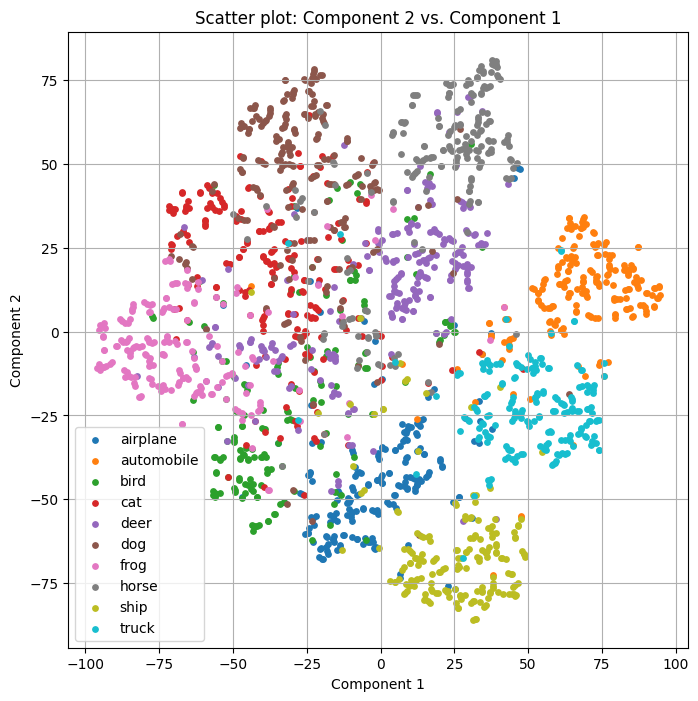

In [14]:
from sklearn.manifold import TSNE
X_embedded = TSNE(n_components=2, perplexity=5).fit_transform(features)
make_scatterplot(X_embedded, y.flatten(), class_definition=class_definition)

<ipython-input-11-5a944b56079f>:20: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab10', 10).colors[:,:3]


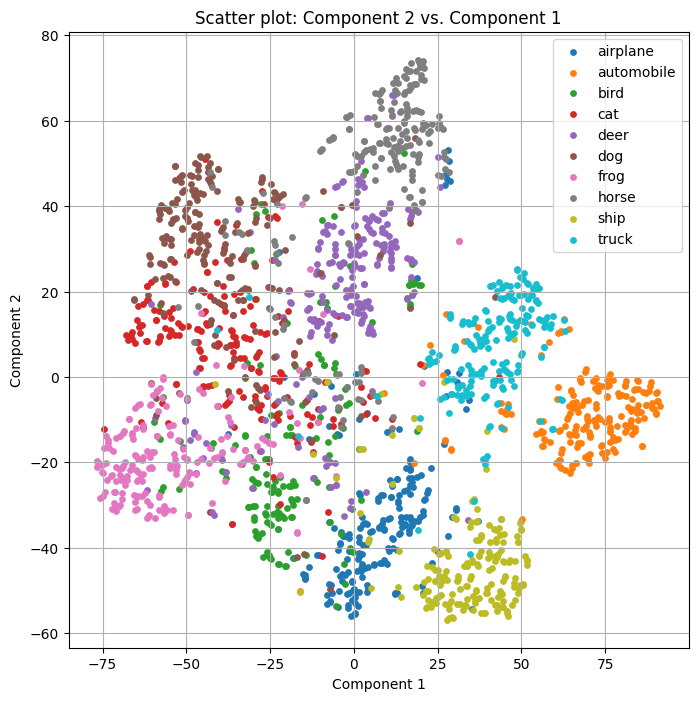

In [15]:
X_embedded = TSNE(n_components=2, perplexity=10).fit_transform(features)
make_scatterplot(X_embedded, y.flatten(), class_definition=class_definition)

<ipython-input-11-5a944b56079f>:20: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab10', 10).colors[:,:3]


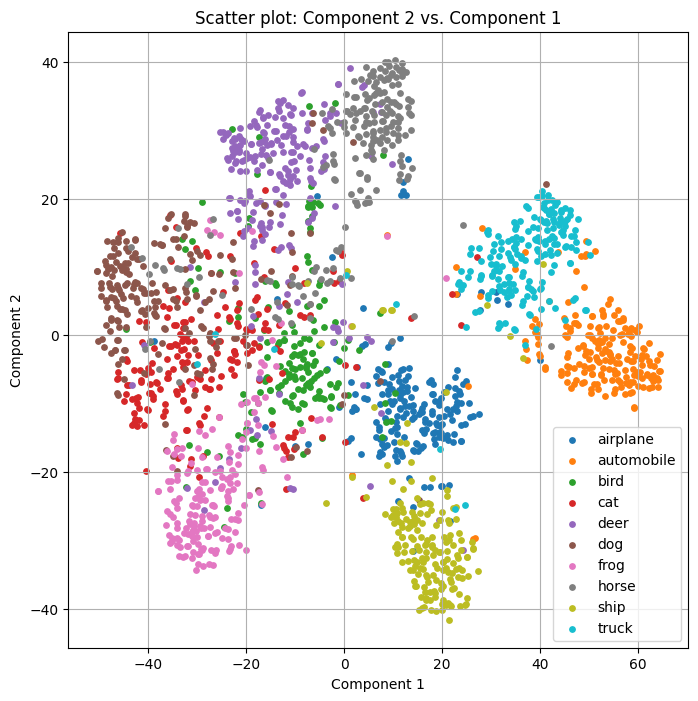

In [16]:
X_embedded = TSNE(n_components=2, perplexity=30).fit_transform(features)
make_scatterplot(X_embedded, y.flatten(), class_definition=class_definition)

**Assignment**: Explain what is a feature vector (hint: other terms in the literature are "Encodings", "Embeddings") \\
A feature vector is a numerical representation of an object—in this case, an image—in a format that a machine learning model can use, interpret, and process. Typically, the feature vector is a projection of the input data into a lower-dimensional numerical space. For example, an image may consist of millions of pixels, resulting in an initial representation with over a million dimensions. This data can then be projected into a feature vector with significantly fewer dimensions, such as 100 to 1,000, while retaining the most important information.

**Assignment**: Try out several perplexities: 5, 10, 30. What do you observe?

With a higher perplexity, the clusters become denser and more well-defined. This makes sense, as higher perplexity emphasizes global structures, leading to more cohesive clustering. In contrast, lower perplexity highlights smaller-scale structures, enhancing local details.

In [17]:
features = []
y = []
for data in val_loader:
  x_batch, y_batch = data
  y.append(y_batch)
  with torch.no_grad():
    features_batch = model.forward(x_batch.to(device))
  features.append(features_batch.cpu())

features = torch.vstack(features).numpy()
y = torch.hstack(y).numpy()

idxs_sampled = np.random.choice(np.arange(len(features)), 2000, replace=False)
features = features[idxs_sampled]
y = y[idxs_sampled]

<ipython-input-11-5a944b56079f>:20: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab10', 10).colors[:,:3]


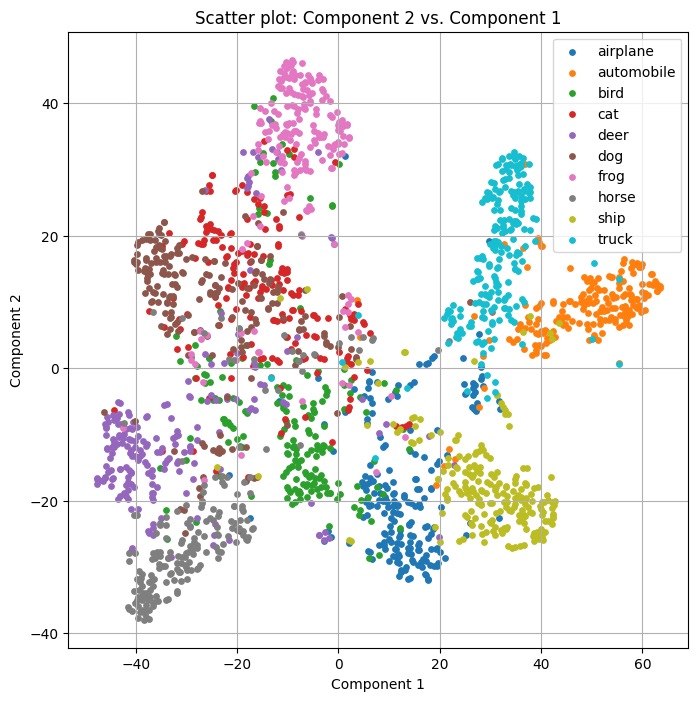

In [18]:
X_embedded = TSNE(n_components=2, perplexity=30).fit_transform(features)
make_scatterplot(X_embedded, y.flatten(), class_definition=class_definition)

**Assignment**: Visualize now the embeddings at the two fully connected layers. Why are the representations so strikingly different? Imagine you would like to use the same representations in another project (same image size, but other classes). Which of the representations seems less useful? Why?
Visualizing the t-SNE on the embedding provides insights into how the model groups data based on low-level features. In contrast, applying t-SNE at the end of the classifier reveals how well the model distinguishes between classes after learning complex, high-level features. Typically, the latter gives a clearer view of the model's ability to separate distinct classes.

The t-SNE visualization of the output seems more useful if we change our problem, as it helps us determine whether the algorithm successfully identifies the different classes.



In [19]:
not_train_model = CNNModel().eval().to(device)
features = []
output = []
y = []
for data in val_loader:
  x_batch, y_batch = data
  y.append(y_batch)
  with torch.no_grad():
    features_batch = not_train_model.features(x_batch.to(device))
    output_batch = not_train_model.forward(x_batch.to(device))
  features.append(features_batch.cpu())
  output.append(output_batch.cpu())

features = torch.vstack(features).numpy()
output = torch.vstack(output).numpy()
y = torch.hstack(y).numpy()

idxs_sampled = np.random.choice(np.arange(len(features)), 2000, replace=False)
features = features[idxs_sampled]
output = output[idxs_sampled]
y = y[idxs_sampled]

<ipython-input-11-5a944b56079f>:20: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab10', 10).colors[:,:3]


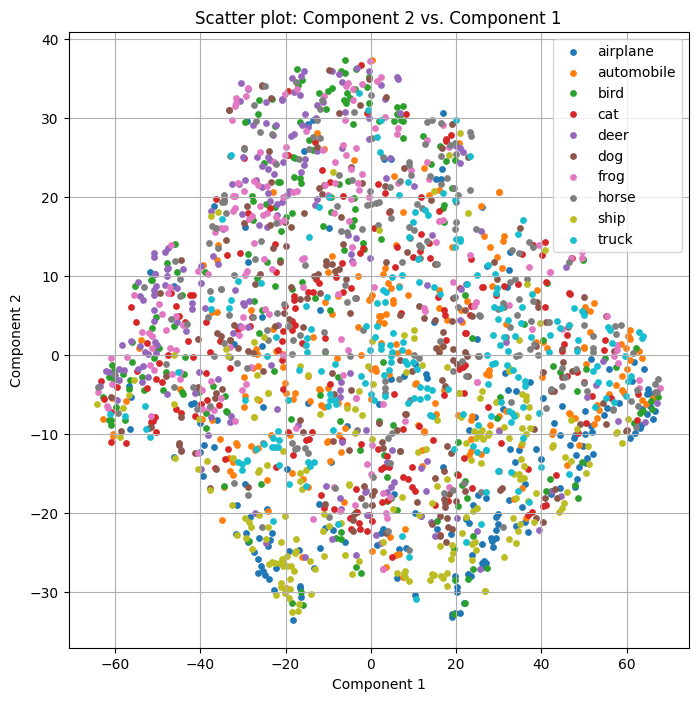

In [20]:
X_embedded = TSNE(n_components=2, perplexity=30).fit_transform(features)
make_scatterplot(X_embedded, y.flatten(), class_definition=class_definition)

<ipython-input-11-5a944b56079f>:20: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab10', 10).colors[:,:3]


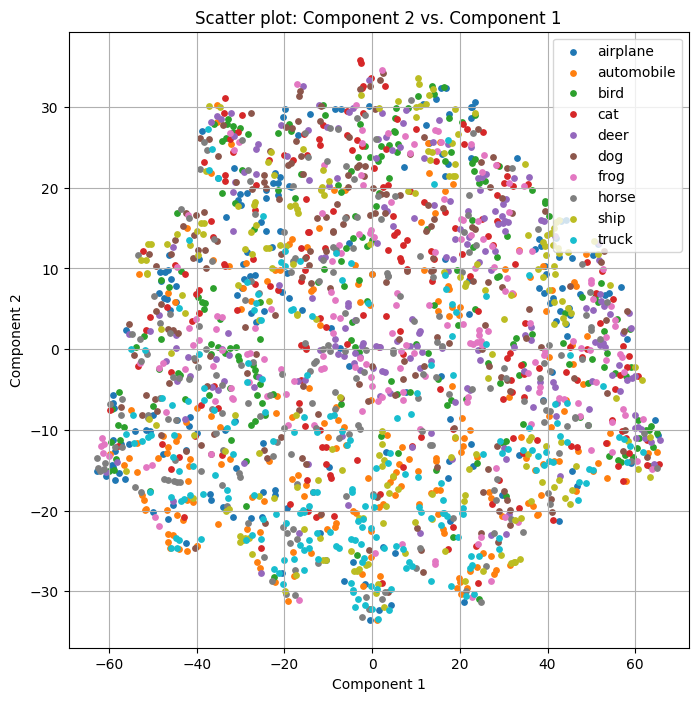

In [21]:
X_embedded = TSNE(n_components=2, perplexity=30).fit_transform(output)
make_scatterplot(X_embedded, y.flatten(), class_definition=class_definition)

**Assignment**: Visualize the tSNE plot of the model before training, what do you observe? (flatten layer and last fully_connected layer)
For both t-SNE plot, no clusters are formed. the distribution seems totally random

# Classification activation maps (grad-CAM)

Classification activation maps provide certainly the most popular visualization methods for network inspection.

In [22]:
import torch
import matplotlib.pyplot as plt


device = "cuda" if torch.cuda.is_available() else "cpu"

In [23]:
!pip install gdown
!gdown --id 1-ypc0JK1Hp4d3dfO6eq0mPcx669PthXw --output /content/imagenet.zip
!unzip -q /content/imagenet.zip
!rm /content/imagenet.zip

/usr/local/lib/python3.10/dist-packages/gdown/__main__.py:140: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From: https://drive.google.com/uc?id=1-ypc0JK1Hp4d3dfO6eq0mPcx669PthXw
To: /content/imagenet.zip
100% 1.72M/1.72M [00:00<00:00, 115MB/s]


In [24]:
!pip install torchcam --quiet

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.0/46.0 kB 3.4 MB/s eta 0:00:00


Next, we will load VGG16, pretrained on `ImageNet`. This is the network we are going to investigate.

In [25]:
from torchvision import models
import torch.nn.functional as F

torch.cuda.empty_cache()
model = models.vgg16(weights=models.VGG16_Weights.IMAGENET1K_V1)
model = model.eval().to(device)

labels_names = models.VGG16_Weights.IMAGENET1K_V1.meta["categories"]

Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth
100%|██████████| 528M/528M [00:06<00:00, 84.1MB/s]


Now, we load an image from the `ImageNet` data base. We have downloaded these images: they are in the folder `imagenet`.

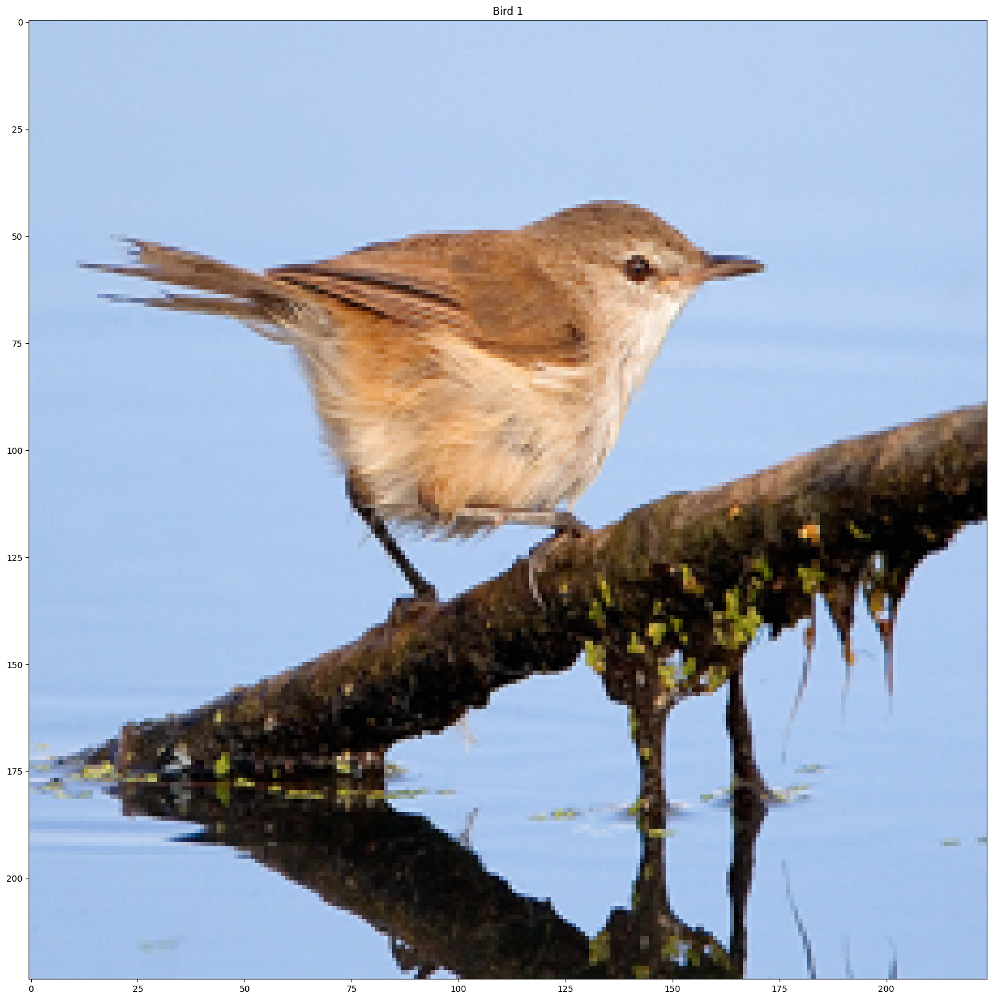

In [28]:
import os
from PIL import Image

filename_bird = '418657219_3567961db1.jpg'
folder_name = '/content/imagenet'

# animals:
filename_dog = '425248370_b15374000e.jpg'
filename_bird_2 = '485627874_8f4144223a.jpg'

# bridges:
filename_b1 = 'bridge1.jpg'
filename_b2 = 'bridge2.jpg'
filename_b3 = 'bridge3.jpg'

image_bird = Image.open(os.path.join(folder_name, filename_bird)).resize((224, 224))
image_dog = Image.open(os.path.join(folder_name, filename_dog)).resize((224, 224))
image_bird_2 = Image.open(os.path.join(folder_name, filename_bird_2)).resize((224, 224))
image_b1 = Image.open(os.path.join(folder_name, filename_b1)).resize((224, 224))
image_b2 = Image.open(os.path.join(folder_name, filename_b2)).resize((224, 224))
image_b3 = Image.open(os.path.join(folder_name, filename_b3)).resize((224, 224))
plt.title('Bird 1')
plt.imshow(image_bird)


Now, we will predict the label of the image.

In [29]:
from torchvision import transforms


preprocess = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225])  # Normalize to match ImageNet
])

img_prep = preprocess(image_bird)
img_prep = img_prep.unsqueeze(0)

with torch.no_grad():
    img_prediction = model(img_prep.to(device))

# Get probabilities by applying softmax to the output
probs = F.softmax(img_prediction, dim=1)

# Convert the probabilities to a numpy array and get the top 3 predictions
top_probs, top_indices = torch.topk(probs, 3, dim=1)
top_probs = top_probs.squeeze().cpu().numpy()
top_indices = top_indices.squeeze().cpu().numpy()

for i in range(3):
    label = labels_names[top_indices[i]]
    print(f"{label}: {top_probs[i] * 100:.2f}%")

# Get the solution index with the maximum probability
max_index = top_indices[0]
print('Predicted Index:', max_index)

water ouzel: 97.20%
jay: 0.65%
red-backed sandpiper: 0.64%
Predicted Index: 20


We will use the [Grad-Cam++](https://arxiv.org/pdf/1710.11063) implementation from torch-cam https://github.com/frgfm/torch-cam

Note that the output of the model needs to be the the logits and not probabilities (default behaviour in torchvision mdeols). The reason is that with `softmax` we cannot study the influence of neurons on the output $y_k$, if the output depends on all classes (which is the case when we use `softmax`).

water ouzel: 97.20%
jay: 0.65%
red-backed sandpiper: 0.64%


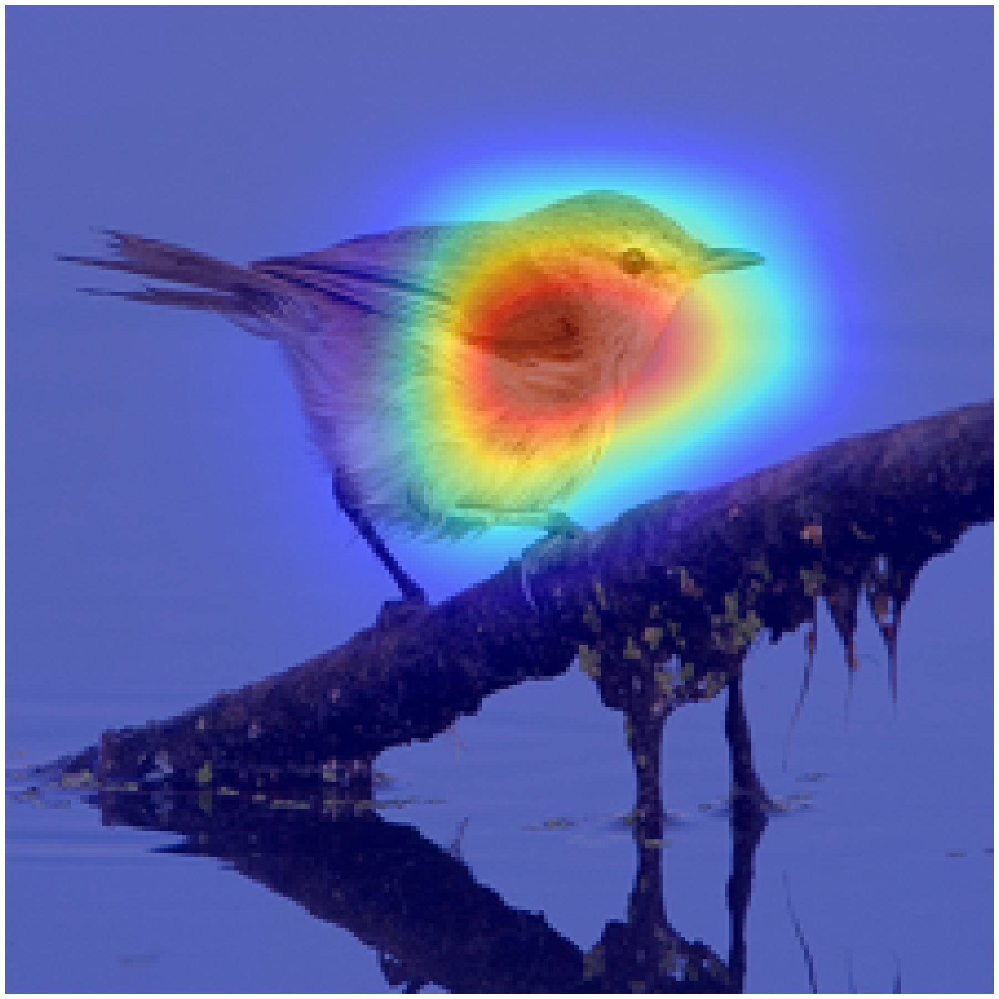

In [37]:
from torchcam.methods import GradCAMpp
from torchcam.utils import overlay_mask
from torchvision.transforms.functional import to_pil_image


img_prep = preprocess(image_bird)
img_prep = img_prep.unsqueeze(0)
with torch.no_grad():
    img_prediction = model(img_prep.to(device))

# Get probabilities by applying softmax to the output
probs = F.softmax(img_prediction, dim=1)

# Convert the probabilities to a numpy array and get the top 3 predictions
top_probs, top_indices = torch.topk(probs, 3, dim=1)
top_probs = top_probs.squeeze().cpu().numpy()
top_indices = top_indices.squeeze().cpu().numpy()

for i in range(3):
    label = labels_names[top_indices[i]]
    print(f"{label}: {top_probs[i] * 100:.2f}%")

with GradCAMpp(model) as cam_extractor:
    # Preprocess your data and feed it to the model
    out = model(img_prep.to(device))
    # Retrieve the CAM by passing the class index and the model output
    activation_map = cam_extractor(out.squeeze(0).argmax().item(), out)

# Resize the CAM and overlay it
result = overlay_mask(image_bird, to_pil_image(activation_map[0].squeeze(0), mode='F'), alpha=0.5)
# Display it
plt.imshow(result); plt.axis('off'); plt.tight_layout(); plt.show()

standard schnauzer: 72.13%
miniature schnauzer: 20.36%
giant schnauzer: 3.52%


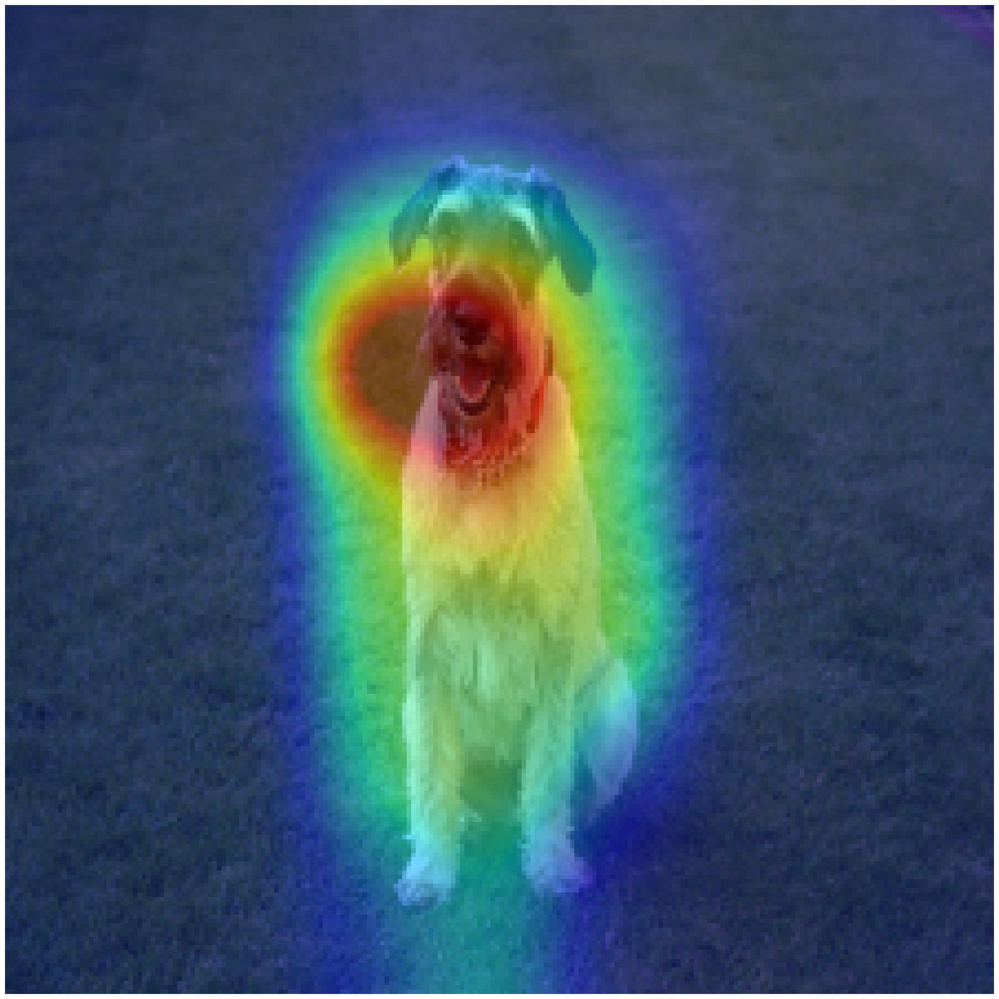

In [38]:
img_prep = preprocess(image_dog)
img_prep = img_prep.unsqueeze(0)
with torch.no_grad():
    img_prediction = model(img_prep.to(device))

# Get probabilities by applying softmax to the output
probs = F.softmax(img_prediction, dim=1)

# Convert the probabilities to a numpy array and get the top 3 predictions
top_probs, top_indices = torch.topk(probs, 3, dim=1)
top_probs = top_probs.squeeze().cpu().numpy()
top_indices = top_indices.squeeze().cpu().numpy()

for i in range(3):
    label = labels_names[top_indices[i]]
    print(f"{label}: {top_probs[i] * 100:.2f}%")
with GradCAMpp(model) as cam_extractor:
    # Preprocess your data and feed it to the model
    out = model(img_prep.to(device))
    # Retrieve the CAM by passing the class index and the model output
    activation_map = cam_extractor(out.squeeze(0).argmax().item(), out)

# Resize the CAM and overlay it
result = overlay_mask(image_dog, to_pil_image(activation_map[0].squeeze(0), mode='F'), alpha=0.5)
# Display it
plt.imshow(result); plt.axis('off'); plt.tight_layout(); plt.show()

bee eater: 81.24%
macaw: 13.22%
bulbul: 1.88%


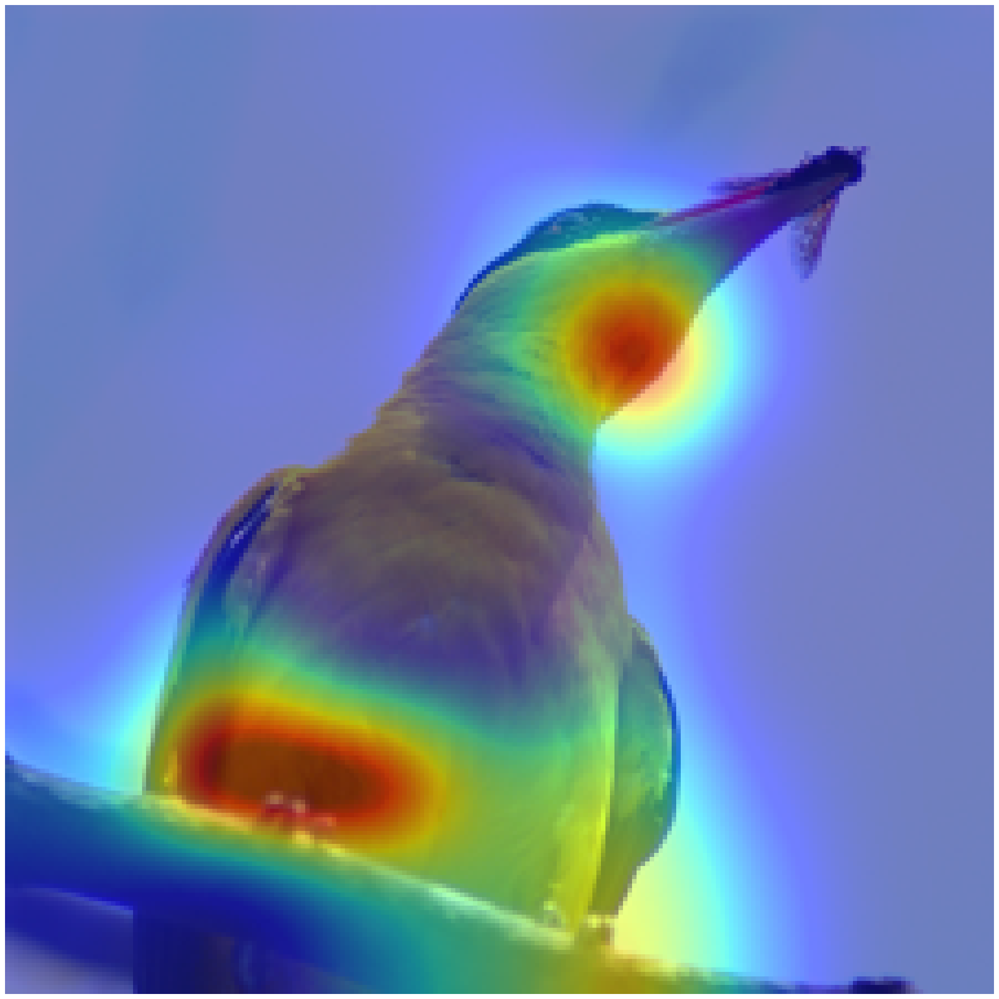

In [39]:
img_prep = preprocess(image_bird_2)
img_prep = img_prep.unsqueeze(0)
with torch.no_grad():
    img_prediction = model(img_prep.to(device))

# Get probabilities by applying softmax to the output
probs = F.softmax(img_prediction, dim=1)

# Convert the probabilities to a numpy array and get the top 3 predictions
top_probs, top_indices = torch.topk(probs, 3, dim=1)
top_probs = top_probs.squeeze().cpu().numpy()
top_indices = top_indices.squeeze().cpu().numpy()

for i in range(3):
    label = labels_names[top_indices[i]]
    print(f"{label}: {top_probs[i] * 100:.2f}%")
with GradCAMpp(model) as cam_extractor:
    # Preprocess your data and feed it to the model
    out = model(img_prep.to(device))
    # Retrieve the CAM by passing the class index and the model output
    activation_map = cam_extractor(out.squeeze(0).argmax().item(), out)

# Resize the CAM and overlay it
result = overlay_mask(image_bird_2, to_pil_image(activation_map[0].squeeze(0), mode='F'), alpha=0.5)
# Display it
plt.imshow(result); plt.axis('off'); plt.tight_layout(); plt.show()

schooner: 27.15%
pier: 10.60%
wreck: 9.71%


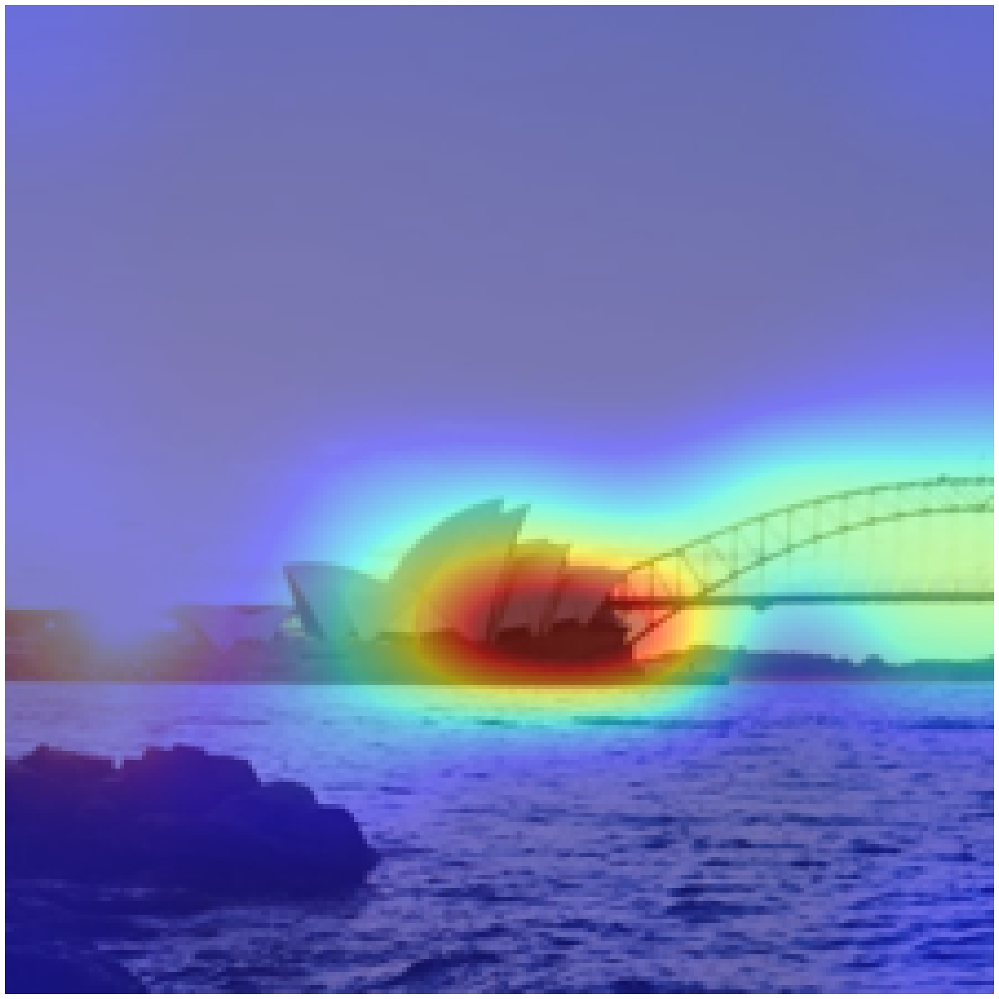

In [40]:
img_prep = preprocess(image_b1)
img_prep = img_prep.unsqueeze(0)
with torch.no_grad():
    img_prediction = model(img_prep.to(device))

# Get probabilities by applying softmax to the output
probs = F.softmax(img_prediction, dim=1)

# Convert the probabilities to a numpy array and get the top 3 predictions
top_probs, top_indices = torch.topk(probs, 3, dim=1)
top_probs = top_probs.squeeze().cpu().numpy()
top_indices = top_indices.squeeze().cpu().numpy()

for i in range(3):
    label = labels_names[top_indices[i]]
    print(f"{label}: {top_probs[i] * 100:.2f}%")
with GradCAMpp(model) as cam_extractor:
    # Preprocess your data and feed it to the model
    out = model(img_prep.to(device))
    # Retrieve the CAM by passing the class index and the model output
    activation_map = cam_extractor(out.squeeze(0).argmax().item(), out)

# Resize the CAM and overlay it
result = overlay_mask(image_b1, to_pil_image(activation_map[0].squeeze(0), mode='F'), alpha=0.5)
# Display it
plt.imshow(result); plt.axis('off'); plt.tight_layout(); plt.show()

steel arch bridge: 66.78%
bicycle-built-for-two: 6.95%
sunglasses: 5.86%


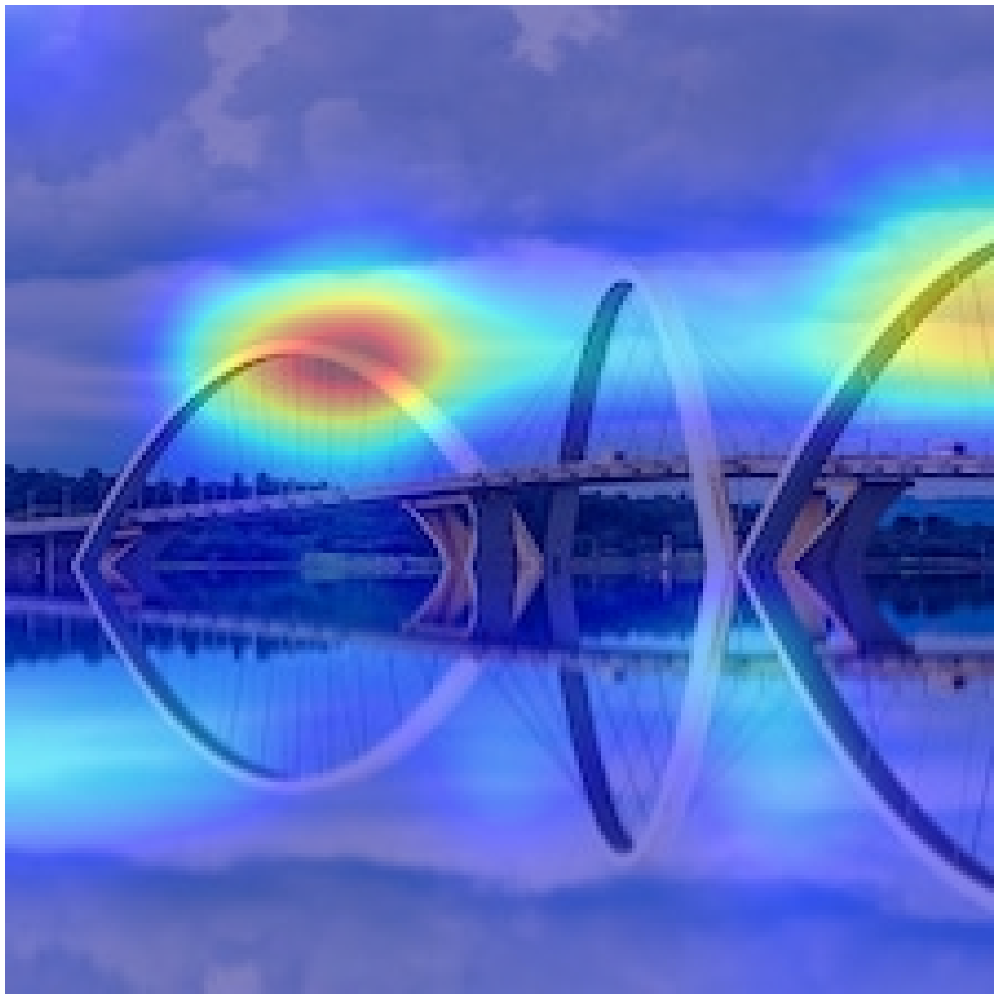

In [41]:
img_prep = preprocess(image_b2)
img_prep = img_prep.unsqueeze(0)
with torch.no_grad():
    img_prediction = model(img_prep.to(device))

# Get probabilities by applying softmax to the output
probs = F.softmax(img_prediction, dim=1)

# Convert the probabilities to a numpy array and get the top 3 predictions
top_probs, top_indices = torch.topk(probs, 3, dim=1)
top_probs = top_probs.squeeze().cpu().numpy()
top_indices = top_indices.squeeze().cpu().numpy()

for i in range(3):
    label = labels_names[top_indices[i]]
    print(f"{label}: {top_probs[i] * 100:.2f}%")
with GradCAMpp(model) as cam_extractor:
    # Preprocess your data and feed it to the model
    out = model(img_prep.to(device))
    # Retrieve the CAM by passing the class index and the model output
    activation_map = cam_extractor(out.squeeze(0).argmax().item(), out)

# Resize the CAM and overlay it
result = overlay_mask(image_b2, to_pil_image(activation_map[0].squeeze(0), mode='F'), alpha=0.5)
# Display it
plt.imshow(result); plt.axis('off'); plt.tight_layout(); plt.show()

suspension bridge: 71.03%
pier: 13.15%
dam: 5.00%


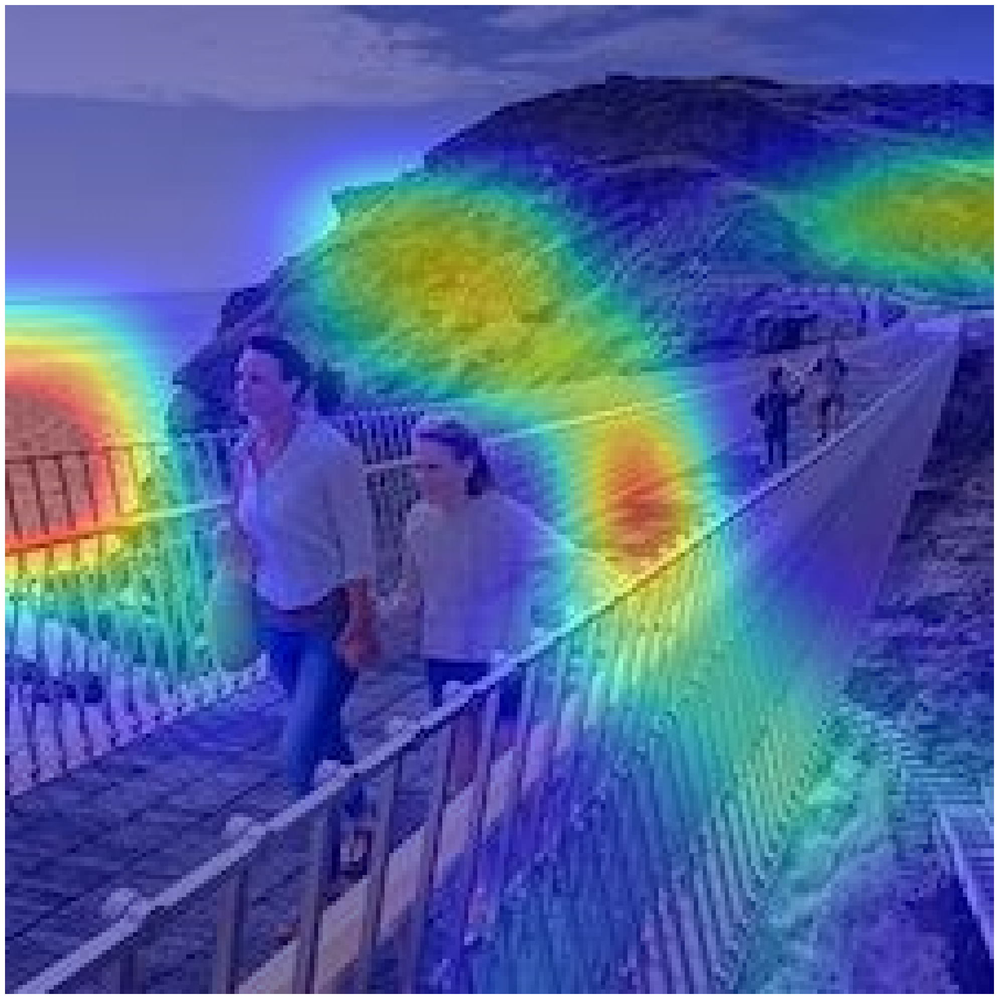

In [42]:
img_prep = preprocess(image_b3)
img_prep = img_prep.unsqueeze(0)
with torch.no_grad():
    img_prediction = model(img_prep.to(device))

# Get probabilities by applying softmax to the output
probs = F.softmax(img_prediction, dim=1)

# Convert the probabilities to a numpy array and get the top 3 predictions
top_probs, top_indices = torch.topk(probs, 3, dim=1)
top_probs = top_probs.squeeze().cpu().numpy()
top_indices = top_indices.squeeze().cpu().numpy()

for i in range(3):
    label = labels_names[top_indices[i]]
    print(f"{label}: {top_probs[i] * 100:.2f}%")
with GradCAMpp(model) as cam_extractor:
    # Preprocess your data and feed it to the model
    out = model(img_prep.to(device))
    # Retrieve the CAM by passing the class index and the model output
    activation_map = cam_extractor(out.squeeze(0).argmax().item(), out)

# Resize the CAM and overlay it
result = overlay_mask(image_b3, to_pil_image(activation_map[0].squeeze(0), mode='F'), alpha=0.5)
# Display it
plt.imshow(result); plt.axis('off'); plt.tight_layout(); plt.show()

**Assignment:** Test the grad-CAM first on the three animal images, and verify that you obtain a reasonable result. Then test the algorithm on the three bridge images. Visualize the top-3 predictions.(Make a nice plot with the results)

*   For `Bridge1.jpg` you obtain a wrong classification, but what can be said about the learned network in view of the visualization of the top-3 predictions?

The visualization of the network is centered around the Sydney Opera House, which was designed to resemble a boat. As a result, the model mistakenly interpreted it as an actual boat in a harbor.


*   For `Bridge3.jpg` you get the right result, but what can you say about the "understanding" of the image in view of your visualization result?

The model disregarded the human figure in the image, instead concentrating on other elements. It learned that humans do not aid in classification, so it focused on features like the barrier and bridge deck, leading it to label the image as one containing bricks.


Note that the correspondence of class names and indices can be found at:
[ImageNet](https://gist.github.com/yrevar/942d3a0ac09ec9e5eb3a)


# Activation Maximization

So far, we visualized activations of images, i.e. we focused on visualizations of inner network representations for given image data.

We can also visualize properties of the network itself. A popular method is the activation maximization, where we seek an image that would maximize a given neuron inside the network.

For this, we solve the maximization problem:
\begin{equation}
x^{\ast} = {\arg \max}_{x} z(x)
\end{equation}
where $z(x)$ is the value of an arbitrary neuron (or a set of neurons, e.g. the neurons in one feature map) in the network.

Typically, $z(x)=S_c(x)$ is the value of the output layer for one particular class. We therefore seek the image that maximizes the output for a particular class (e.g. the output for `water_ouzel`, `index: 20`).

More information here: https://distill.pub/2017/feature-visualization/

In [43]:
#@title Maximum activation visualization functions

# Inspired from  tf-keras-vis https://github.com/keisen/tf-keras-vis/blob/c793148ff6bc97d03880b107b958fb9c4f87efc5/tf_keras_vis/activation_maximization/__init__.py#L17

import torch.nn as nn
import numpy as np


class TotalVariation2D(nn.Module):
    """A regularizer that introduces Total Variation."""

    def __init__(self, weight=10.0, name='TotalVariation2D'):
        """
        Args:
            weight: This value will be applied to TotalVariation values.
                Defaults to 10.0.
            name : Instance name.
                Defaults to 'TotalVariation2D'.
        """
        super(TotalVariation2D, self).__init__()
        self.weight = float(weight)

    def forward(self, input_value):
        if len(input_value.shape) != 4:
            raise ValueError("Input shape must be (batch_size, channels, height, width), "
                             f"but was {input_value.shape}.")

        # Calculate total variation
        tv = torch.sum(torch.abs(input_value[:, :, 1:, :] - input_value[:, :, :-1, :])) + \
             torch.sum(torch.abs(input_value[:, :, :, 1:] - input_value[:, :, :, :-1]))

        # Normalize by the number of elements and apply weight
        tv /= float(input_value.shape[1] * input_value.shape[2] * input_value.shape[3])
        tv *= self.weight
        return tv


class Norm(nn.Module):
    """A regularizer that introduces Norm."""

    def __init__(self, weight=10.0, p=2, name='Norm'):
        """
        Args:
            weight: This weight will be applied to the norm values.
                Defaults to 10.
            p: Order of the norm. Defaults to 2.
            name: Instance name. Defaults to 'Norm'.
        """
        super(Norm, self).__init__()
        self.weight = float(weight)
        self.p = int(p)

    def forward(self, input_value):
        # Reshape to (batch_size, -1) for calculating norm
        reshaped_input = input_value.view(input_value.shape[0], -1)

        # Compute the norm along the specified dimension
        norm = torch.norm(reshaped_input, p=self.p, dim=1)

        # Normalize without in-place operations
        norm = norm / (reshaped_input.shape[1] ** (1.0 / float(self.p)))
        norm = norm * self.weight

        # Return the norm as a scalar by taking the mean
        return norm.mean()


class Jitter:
    """An input modifier that introduces random jitter.
       Jitter has been shown to produce crisper activation maximization images.
    """

    def __init__(self, jitter=8):
        """
        Args:
            jitter: The amount of jitter to apply. Defaults to 8.
        """
        self.jitter = int(jitter)

    def __call__(self, seed_input):
        ndim = len(seed_input.shape)
        if ndim < 3:
            raise ValueError("The dimensions of seed_input must be 3 or more "
                             f"(batch_size, ..., channels), but was {ndim}.")

        # Generate random shifts within the jitter range for each spatial dimension
        shifts = tuple(np.random.randint(-self.jitter, self.jitter) for _ in range(ndim - 2))
        axes = tuple(range(1, ndim - 1))  # Apply shifts to all spatial dimensions

        # Apply torch.roll to create jitter
        seed_input = torch.roll(seed_input, shifts=shifts, dims=axes)

        return seed_input


class Rotate2D:
    """An input modifier for 2D that introduces random rotation."""

    def __init__(self, degree=3.0):
        """
        Args:
            degree: The maximum degree of rotation to apply.
        """
        self.degree = float(degree)
        self.random_generator = np.random.default_rng()

    def __call__(self, seed_input):
        # Check input dimensions
        if len(seed_input.shape) != 4:
            raise ValueError("Input shape must be (batch_size, channels, height, width), "
                             f"but was {seed_input.shape}.")

        # Get a random rotation angle within the specified range
        angle = self.random_generator.uniform(-self.degree, self.degree)

        # Rotation requires transformation matrix
        theta = torch.tensor([
            [torch.cos(torch.tensor(angle * np.pi / 180)), -torch.sin(torch.tensor(angle * np.pi / 180)), 0],
            [torch.sin(torch.tensor(angle * np.pi / 180)),  torch.cos(torch.tensor(angle * np.pi / 180)), 0]
        ], dtype=seed_input.dtype, device=seed_input.device)

        # Expand to a batch of transformation matrices
        theta = theta.unsqueeze(0).repeat(seed_input.size(0), 1, 1)

        # Create affine grid for rotation and apply it with grid_sample
        grid = F.affine_grid(theta, seed_input.size(), align_corners=False)
        rotated_input = F.grid_sample(seed_input, grid, align_corners=False, padding_mode='reflection')

        return rotated_input



class ActivationMaximization:
    def __init__(self, model, lr=5e-2, plot_iterations=100):
        """
        Args:
            model: The neural network model.
            neuron_index: Index of the neuron to visualize.
            input_shape: Shape of the input image. Defaults to (224, 224).
            lr: Learning rate for optimization. Defaults to 5e-2.
            tv_loss_weight: Weight for the total variation loss. Defaults to 1e-5.
            num_iterations: Number of iterations for activation maximization. Defaults to 4000.
            plot_iterations: Number of iterations between plot updates. Defaults to 100.
        """
        self.model = model
        self.lr = lr
        self.total_var = TotalVariation2D(weight=5.)
        self.norm = Norm(weight=1.)
        self.jitter_transform = Jitter(jitter=4)
        self.rotate = Rotate2D(degree=1.)
        self.plot_iterations = plot_iterations
        self.to_pil = transforms.ToPILImage()

        device = "cuda" if torch.cuda.is_available() else "cpu"
        self.mean_imagenet = torch.tensor([0.485, 0.456, 0.406]).view((1, 3, 1, 1)).to(device)
        self.std_imagenet = torch.tensor([0.229, 0.224, 0.225]).view((1, 3, 1, 1)).to(device)

    @staticmethod
    def total_variation_loss(x):
        """Calculates the total variation loss for an input tensor."""
        tv_loss = torch.sum(torch.abs(x[:, :, 1:, :] - x[:, :, :-1, :])) + \
                  torch.sum(torch.abs(x[:, :, :, 1:] - x[:, :, :, :-1]))
        return tv_loss

    def apply_norm(self, x):
        """Applies normalization to the input tensor (if necessary)."""
        # Placeholder for normalization; adjust as needed for your model
        return (x - self.mean_imagenet) / self.std_imagenet

    def visualize(self, neuron_index, input_shape=(224, 224), num_iterations=2000):
        tensor_shape = (1, 3) + input_shape
        input_tensor = torch.randn(tensor_shape, requires_grad=True, device="cuda")
        #optimizer = torch.optim.Adam([input_tensor], lr=self.lr)
        optimizer = torch.optim.RMSprop([input_tensor], lr=self.lr, alpha=0.999)

        # Activation Maximization Loop
        for i in range(num_iterations):
            optimizer.zero_grad()

            # Forward pass for neuron activation
            with torch.no_grad():
                input_tensor.copy_(self.jitter_transform(input_tensor))
                input_tensor.copy_(self.rotate(input_tensor))
            neuron_activation = self.model(self.apply_norm(input_tensor))[..., neuron_index]
            activation_loss = -neuron_activation.mean()  # Negative to maximize

            # Total variation loss
            total_var = self.total_var(input_tensor)
            norm = self.norm(input_tensor)
            regularizer_loss = total_var + norm
            loss = activation_loss + regularizer_loss

            # Backward and optimize
            loss.backward()
            optimizer.step()

            # Clamp values to the display range [0, 1]
            input_tensor.data = torch.clamp(input_tensor.data, 0, 1)

            # Logging or visualization step
            if i % self.plot_iterations == 0:
                print(f"Iteration {i}/{num_iterations}, Activation: {-activation_loss.item()}, TotalVar: {total_var.item()}, TotalVar: {norm.item()}")

        # Display the final maximized image
        optimized_image = input_tensor.squeeze().cpu().detach().clamp(0, 1)
        plt.imshow(self.to_pil(optimized_image))
        plt.title(f"Activation Maximization for Neuron {neuron_index}")
        plt.axis("off")
        plt.show()

Iteration 0/2000, Activation: -0.5112194418907166, TotalVar: 6.497962951660156, TotalVar: 0.6803219318389893
Iteration 100/2000, Activation: 2.630156993865967, TotalVar: 1.5814764499664307, TotalVar: 0.5511568784713745
Iteration 200/2000, Activation: 16.20822525024414, TotalVar: 1.3837394714355469, TotalVar: 0.543262779712677
Iteration 300/2000, Activation: 23.812801361083984, TotalVar: 1.271426796913147, TotalVar: 0.538236677646637
Iteration 400/2000, Activation: 12.620205879211426, TotalVar: 1.1471987962722778, TotalVar: 0.5336259603500366
Iteration 500/2000, Activation: 18.793149948120117, TotalVar: 1.044611930847168, TotalVar: 0.5267062187194824
Iteration 600/2000, Activation: 37.55073547363281, TotalVar: 1.013412356376648, TotalVar: 0.5267318487167358
Iteration 700/2000, Activation: 45.47428512573242, TotalVar: 1.0161492824554443, TotalVar: 0.5281245708465576
Iteration 800/2000, Activation: 85.0724868774414, TotalVar: 0.9809359908103943, TotalVar: 0.5293467044830322
Iteration 900/

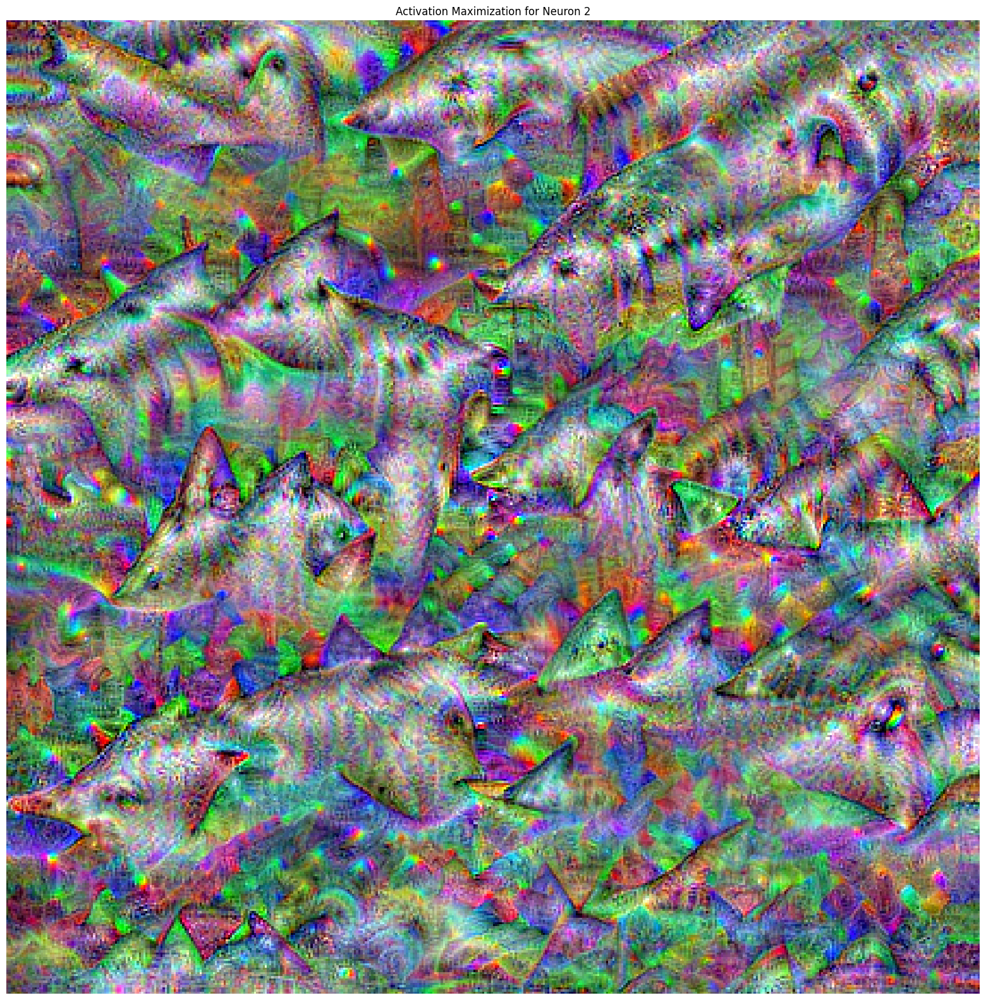

In [49]:
#neuron_index = labels_names.index("Indian elephant")
neuron_index = 2

activation_maximization = ActivationMaximization(model)
activation_maximization.visualize(neuron_index, num_iterations=2000, input_shape=(448, 448))

Iteration 0/2000, Activation: 0.07165957987308502, TotalVar: 6.100541114807129, TotalVar: 0.6540229320526123
Iteration 100/2000, Activation: 0.07292833924293518, TotalVar: 0.7815388441085815, TotalVar: 0.13548493385314941
Iteration 200/2000, Activation: 0.07289203256368637, TotalVar: 0.5240709781646729, TotalVar: 0.09440147131681442
Iteration 300/2000, Activation: 0.07287095487117767, TotalVar: 0.43838590383529663, TotalVar: 0.08099882304668427
Iteration 400/2000, Activation: 0.07285642623901367, TotalVar: 0.38496750593185425, TotalVar: 0.07055243104696274
Iteration 500/2000, Activation: 0.07284969836473465, TotalVar: 0.36668524146080017, TotalVar: 0.065290667116642
Iteration 600/2000, Activation: 0.07284270226955414, TotalVar: 0.32138752937316895, TotalVar: 0.06019345670938492
Iteration 700/2000, Activation: 0.07283440977334976, TotalVar: 0.3043776750564575, TotalVar: 0.05697951093316078
Iteration 800/2000, Activation: 0.07283790409564972, TotalVar: 0.30698177218437195, TotalVar: 0.05

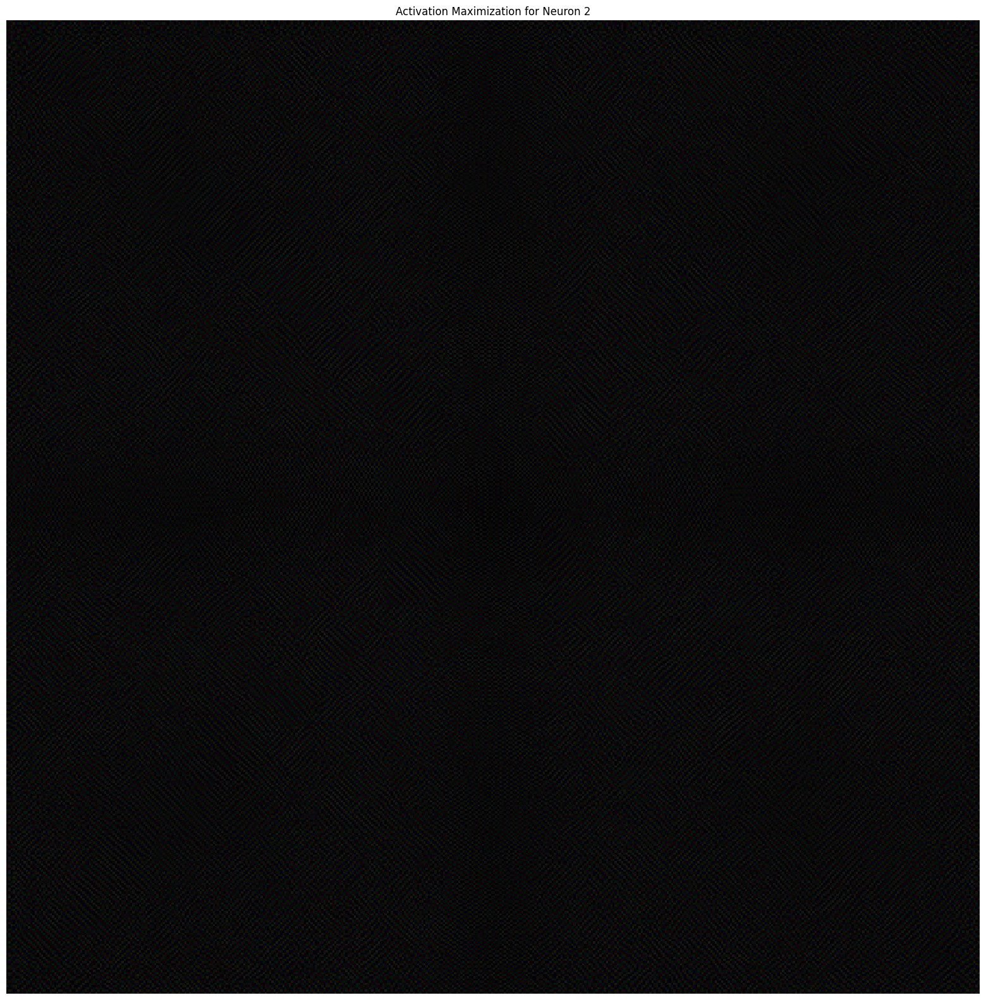

In [50]:
neuron_index = 2

activation_maximization = ActivationMaximization(not_train_model)
activation_maximization.visualize(neuron_index, num_iterations=2000, input_shape=(448, 448))

**Assignment**: You might want to play with this, e.g. 385: Indian elephant, 2: great white shark, 555: fire truck

Other classes can be found at:
[ImageNet](https://gist.github.com/yrevar/942d3a0ac09ec9e5eb3a)

**Assignment:** Generate the activation maximization image the the same index, for a network initialized randomly. What do you observe?
The image that produces the highest output for the untrained model is simply a black image with uniform noise. No distinct patterns emerged.

# Bonus: Visualizing Attention of a ViT Model

The attention mechanism in Vision Transformers (ViT) allows the model to focus on different parts of the input image. The attention weights can be interpreted as a matrix that indicates how much focus the model puts on each part of the image when making predictions.

### Mathematical Formulation

Let $ A $ be the attention matrix derived from the self-attention mechanism of a transformer layer, where:

$$
A = \text{Softmax}\left(\frac{QK^T}{\sqrt{d_k}}\right)
$$

- $Q$ is the query matrix,
- $K$ is the key matrix,
- $d_k$ is the dimensionality of the keys.

The output of the attention layer is simply the dot product $AV$, where $V$ is the value matrix.


In [51]:
import cv2
from transformers import ViTForImageClassification, ViTFeatureExtractor

In [52]:
# Load the ViT model and feature extractor
model = ViTForImageClassification.from_pretrained('google/vit-base-patch16-224')
feature_extractor = ViTFeatureExtractor.from_pretrained('google/vit-base-patch16-224')
model.config.output_attentions = True

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/69.7k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/160 [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/transformers/models/vit/feature_extraction_vit.py:28: FutureWarning: The class ViTFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use ViTImageProcessor instead.
  warnings.warn(


In [53]:
# Load and prepare the image
image_path = './imagenet/418657219_3567961db1.jpg'
image = Image.open(image_path)
inputs = feature_extractor(images=image, return_tensors="pt")

# Pass the image through the model
outputs = model(**inputs)

`ViTSdpaAttention` is used but `torch.nn.functional.scaled_dot_product_attention` does not support `output_attentions=True` or `head_mask`. Falling back to the manual attention implementation, but specifying the manual implementation will be required from Transformers version v5.0.0 onwards. This warning can be removed using the argument `attn_implementation="eager"` when loading the model.


In [54]:
# Extract attention weights
attn_weights = outputs.attentions
attn_weights = torch.stack(attn_weights).squeeze(1)
attn_weights = torch.mean(attn_weights, dim=1) # Average across attention heads in Multi-attention Layers

# Check the shape of the attention weights
print("Shape of attention weights:", attn_weights.shape) # The model is composed of 12 Attention Layers

Shape of attention weights: torch.Size([12, 197, 197])


### Attention Rollout Process

To visualize the contributions of different layers to the final output, we perform an attention rollout.
At every Transformer block, we get an attention Matrix $(A)_{ij}$ that defines how much attention is going to flow from token j in the previous layer to token i in the next layer.
Attention rollout process involves recursively multiplying the attention matrices across multiple layers.
To account for the residual connections, we can add the identity matrix $I$ to the Attention matrices: $A + I$.

Let $A^{l}$ be the attention matrix from layer $l$. The rollout $R$ at layer $l$ is computed as follows:

1. Initialize $R^{0}$ as the attention matrix of the first layer:
   $$
   R^{0} = A^{0}
   $$

2. For each following layer $l$:
   $$
   R^{l} = (A^{l} + I) R^{l-1}
   $$
where $I$ is the Identity matrix.

Let $L$ denotes the index of the last layer. The final rollout $R^{L}_{0}$ can be interpreted as a joint attention representation that indicates how each token attends to every other token throughout the network.

$R^{L}$ can be normalized to obtain a mask:

$$
\text{mask} = \frac{R^{L}_{0}}{\max(R^{L}_{0})}
$$



In [55]:
# Add an identity matrix for bias
residual_att = torch.eye(attn_weights.size(1))
aug_att_mat = attn_weights + residual_att
aug_att_mat = aug_att_mat / aug_att_mat.sum(dim=-1).unsqueeze(-1)

# Recursively multiply the weight matrices
rollout_attentions = torch.zeros(aug_att_mat.size())
rollout_attentions[0] = aug_att_mat[0]
for n in range(1, aug_att_mat.size(0)):
    rollout_attentions[n] = torch.matmul(aug_att_mat[n], rollout_attentions[n-1])

# Attention from the output to the input space
R = rollout_attentions[-1]
grid_size = int(np.sqrt(aug_att_mat.size(-1)))
mask = R[0, 1:].reshape(grid_size, grid_size).detach().numpy()
mask = cv2.resize(mask / mask.max(), image.size)[..., np.newaxis]


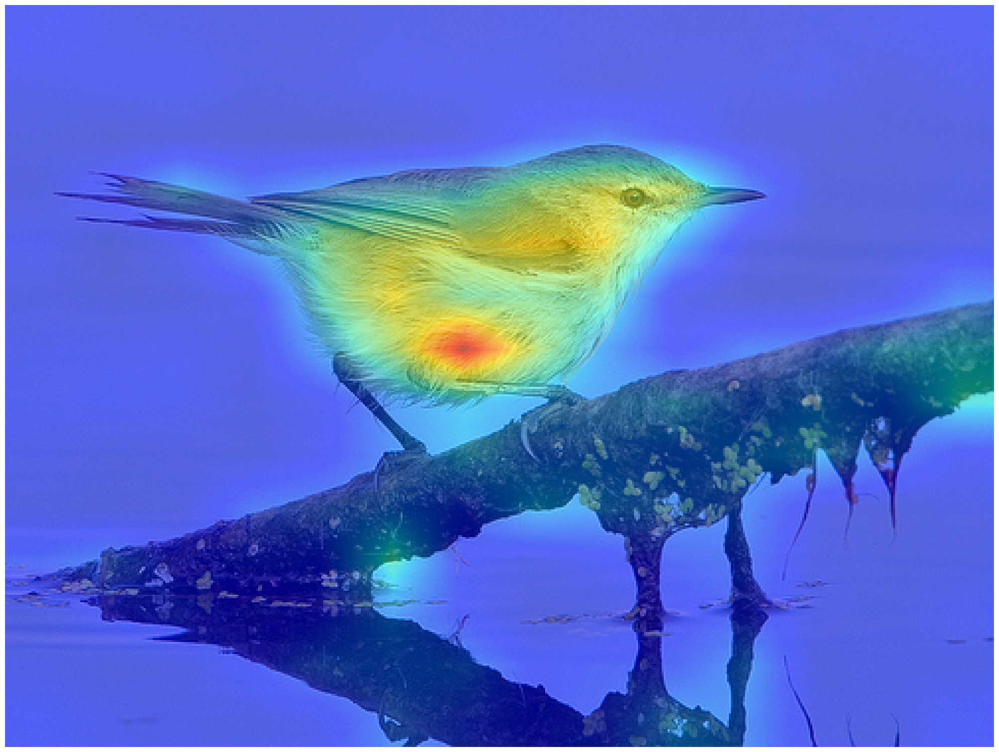

In [56]:
# Resize the CAM and overlay it
result = overlay_mask(image, to_pil_image(mask, mode='F'), alpha=0.5)
# Display it
plt.imshow(result); plt.axis('off'); plt.tight_layout(); plt.show()

**Assignment:** The attention rollout mechanism in ViTs is not class-specific. Could you propose a modification of this mechanism to make it class-specific, drawing inspiration from methods like Grad-CAM?

For each class, we can compute the gradient of the model's output, with respect to the final layer's attention map. We can use this gradient as weights for hour class specific attention map. Then we perform the classic rollout on our weighted attention map.